In [1]:
!pip install captum kymatio

In [2]:
import os
from PIL import Image

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, TensorDataset, DataLoader, SubsetRandomSampler
from torchvision import transforms

import copy
import random
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix

from scipy.ndimage import gaussian_filter
from tqdm import tqdm

from kymatio.torch import Scattering2D
from captum.attr import Saliency, InputXGradient, GuidedBackprop, Deconvolution, IntegratedGradients, Occlusion

In [3]:
# Getting the dataset from drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
##### Global variables
GLOBAL_PATH = '/content/drive/MyDrive/ColabNotebooks/VI/Project'
PATH_TRAIN_DATA = GLOBAL_PATH + '/data/train'
PATH_TEST_DATA = GLOBAL_PATH + '/data/validation'
NUM_CLASSES = 2
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
NUM_EPOCHS = 30
LEARNING_RATE = 1e-3
BATCH_SIZE = 32
K_FOLDS = 5

In [5]:
##### Functions
def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB')

In [6]:
TARGET_IMAGE_SIZE = (128, 128)

list_train_cats = [np.array(get_image(f'{PATH_TRAIN_DATA}/cats/'+f).resize(TARGET_IMAGE_SIZE).convert('RGB')).astype(np.float32) / 255.0 for f in os.listdir(f'{PATH_TRAIN_DATA}/cats')[0:1000]]
list_train_dogs = [np.array(get_image(f'{PATH_TRAIN_DATA}/dogs/'+f).resize(TARGET_IMAGE_SIZE).convert('RGB')).astype(np.float32) / 255.0 for f in os.listdir(f'{PATH_TRAIN_DATA}/dogs')[0:1000]]

train_images = np.stack(list_train_cats + list_train_dogs)
train_labels = np.array([0]*len(list_train_cats) + [1]*len(list_train_dogs))

list_test_cats = [np.array(get_image(f'{PATH_TEST_DATA}/cats/'+f).resize(TARGET_IMAGE_SIZE).convert('RGB')).astype(np.float32) / 255.0 for f in os.listdir(f'{PATH_TEST_DATA}/cats')[0:401]]
list_test_dogs = [np.array(get_image(f'{PATH_TEST_DATA}/dogs/'+f).resize(TARGET_IMAGE_SIZE).convert('RGB')).astype(np.float32) / 255.0 for f in os.listdir(f'{PATH_TEST_DATA}/dogs')[0:401]]

X_test = np.stack(list_test_cats + list_test_dogs)
y_test = np.array([0]*len(list_test_cats) + [1]*len(list_test_dogs))

print(f'Full train set: {train_images.shape}, Full test set: {X_test.shape}')

Full train set: (2000, 128, 128, 3), Full test set: (802, 128, 128, 3)


# CNN def


In [7]:
class CNN_128x128(nn.Module):
    def __init__(self, input_channel: int, num_classes: int):
        super(CNN_128x128, self).__init__()

        # Feature extraction
        self.features = nn.Sequential(
            nn.Conv2d(input_channel, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )

        # Classifier
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 16 * 16, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# Scatnet def

In [8]:
# ScatNet params
J = 3
L = 8
COEFF_ORDER = 2

In [9]:
# Creating scattering transform
scat = Scattering2D(
    J=J,
    L=L,
    max_order=COEFF_ORDER,
    shape=(128, 128),
    out_type='array',
    backend='torch'
).to(DEVICE)

# Counting number of features after scattering
with torch.no_grad():
    dummy_input = torch.randn(1, 3, 128, 128).to(DEVICE)
    dummy_output = scat(dummy_input)
    num_scattering_features = dummy_output.view(1, -1).shape[1]
    print(f'Number of features after scattering: {num_scattering_features}')


class ScatNet2D(nn.Module):
    def __init__(self, scattering: Scattering2D, num_features: int, num_classes: int = 2):
        super(ScatNet2D, self).__init__()
        self.scattering = scattering

        # Same classifier as CNN (except number of inputs)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(num_features, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

        for layer in self.classifier:
            if isinstance(layer, nn.Linear):
                nn.init.xavier_uniform_(layer.weight)

    def forward(self, x):
        x = self.scattering(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Number of features after scattering: 166656


## Dataset preparation

In [10]:
train_images_tensor = torch.from_numpy(train_images).permute(0, 3, 1, 2)
train_labels_tensor = torch.from_numpy(train_labels).long()
train_dataset = TensorDataset(train_images_tensor, train_labels_tensor)

In [11]:
class CatsDogsDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]

        # Convert [0,1] → [0,255] for data transformation
        image = (image * 255).astype(np.uint8)

        if self.transform:
            image = self.transform(image)
        else:
            image = torch.tensor(image, dtype=torch.float32).permute(2,0,1) / 255.0

        return image, label


# Data transformations
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
])

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
])

## K_FOLD CROSS VALIDATION

In [12]:
def train_model_kfold(model_name, model_creator, images, labels,
                      use_augmentation=True, k_folds=5,
                      batch_size=32, num_epochs=10, lr=1e-4):

    kfold = KFold(n_splits=k_folds, shuffle=True, random_state=42)

    fold_train_acc = []
    fold_train_f1 = []
    fold_val_acc = []
    fold_val_f1 = []

    all_folds_train_loss = []
    all_folds_train_acc = []
    all_folds_train_f1 = []
    all_folds_val_loss = []
    all_folds_val_acc = []
    all_folds_val_f1 = []

    best_model = None
    best_val_acc = 0.0
    best_fold = 0

    print(f'\n{"="*60}')
    print(f'Starting {k_folds}-Fold Cross Validation for {model_name}')

    indices = np.arange(len(images))

    for fold, (train_ids, val_ids) in enumerate(kfold.split(indices)):

        # To assure a reproductibility
        torch.manual_seed(42 + fold)
        np.random.seed(42 + fold)
        random.seed(42 + fold)

        # Reinitializing in the loop, not outside
        best_val_acc_in_fold = 0.0
        best_model_state_in_fold = None

        print(f'{"="*60}')
        print(f'{model_name} - FOLD {fold + 1}/{k_folds}')
        print(f'{"="*60}\n')

        if use_augmentation:
            train_dataset = CatsDogsDataset(images[train_ids], labels[train_ids], transform=train_transform)
        else:
            train_images_tensor = torch.from_numpy(images[train_ids]).permute(0, 3, 1, 2)
            train_labels_tensor = torch.from_numpy(labels[train_ids]).long()
            train_dataset = TensorDataset(train_images_tensor, train_labels_tensor)

        val_dataset = CatsDogsDataset(images[val_ids], labels[val_ids], transform=val_transform)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        valid_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

        model = model_creator().to(DEVICE)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=lr)

        loss_train, acc_train, f1_train = [], [], []
        loss_valid, acc_valid, f1_valid = [], [], []

        for epoch in range(num_epochs):
            print(f'Epoch {epoch+1}/{num_epochs}...')

            # TRAINING: calculate per batch (acceptable for train)
            model.train()
            running_loss, running_acc, running_f1 = [], [], []

            for images_batch, labels_batch in train_loader:
                images_batch, labels_batch = images_batch.to(DEVICE), labels_batch.to(DEVICE)
                optimizer.zero_grad()
                outputs = model(images_batch)
                loss = criterion(outputs, labels_batch)
                loss.backward()
                optimizer.step()

                _, predicted = torch.max(outputs, 1)
                running_loss.append(loss.item())
                running_acc.append(accuracy_score(labels_batch.cpu(), predicted.cpu()))
                running_f1.append(f1_score(labels_batch.cpu(), predicted.cpu(), average='weighted'))

            loss_train.append(np.mean(running_loss))
            acc_train.append(np.mean(running_acc))
            f1_train.append(np.mean(running_f1))
            print(f'  Train - Loss: {loss_train[epoch]:.4f}, Acc: {acc_train[epoch]:.4f}, F1: {f1_train[epoch]:.4f}')

            # VALIDATION: accumulate all predictions, calculate ONLY ONCE
            model.eval()
            running_loss = []
            all_val_preds = []
            all_val_labels = []

            with torch.no_grad():
                for images_batch, labels_batch in valid_loader:
                    images_batch, labels_batch = images_batch.to(DEVICE), labels_batch.to(DEVICE)
                    outputs = model(images_batch)
                    loss = criterion(outputs, labels_batch)
                    _, predicted = torch.max(outputs, 1)

                    running_loss.append(loss.item())
                    all_val_preds.extend(predicted.cpu().numpy())
                    all_val_labels.extend(labels_batch.cpu().numpy())

            # Overall calculation across the entire fold, not an average of batches
            loss_valid.append(np.mean(running_loss))
            acc_valid.append(accuracy_score(all_val_labels, all_val_preds))
            f1_valid.append(f1_score(all_val_labels, all_val_preds, average='weighted'))

            print(f'  Valid - Loss: {loss_valid[epoch]:.4f}, Acc: {acc_valid[epoch]:.4f}, F1: {f1_valid[epoch]:.4f}')

            # Checkpoint - Best epoch of this fold
            if acc_valid[epoch] > best_val_acc_in_fold:
                best_val_acc_in_fold = acc_valid[epoch]
                best_model_state_in_fold = copy.deepcopy(model.state_dict())

        # Keeping metrics of the fold
        all_folds_train_loss.append(loss_train)
        all_folds_train_acc.append(acc_train)
        all_folds_train_f1.append(f1_train)
        all_folds_val_loss.append(loss_valid)
        all_folds_val_acc.append(acc_valid)
        all_folds_val_f1.append(f1_valid)

        # Compare best epoch of this fold with global best
        if best_val_acc_in_fold > best_val_acc:
            best_val_acc = best_val_acc_in_fold
            best_fold = fold + 1
            best_model = model_creator().to(DEVICE)
            best_model.load_state_dict(best_model_state_in_fold)

        # Final stats of this fold: best epoch
        best_epoch_idx = np.argmax(acc_valid)
        fold_train_acc.append(acc_train[best_epoch_idx])
        fold_train_f1.append(f1_train[best_epoch_idx])
        fold_val_acc.append(acc_valid[best_epoch_idx])
        fold_val_f1.append(f1_valid[best_epoch_idx])

        print(f'\nFold {fold+1} Best Epoch {best_epoch_idx+1} - Train Acc: {acc_train[best_epoch_idx]:.4f}, Valid Acc: {acc_valid[best_epoch_idx]:.4f}\n')

    # Means on this folds
    avg_train_loss = np.mean(all_folds_train_loss, axis=0)
    avg_train_acc  = np.mean(all_folds_train_acc, axis=0)
    avg_train_f1   = np.mean(all_folds_train_f1, axis=0)
    avg_val_loss   = np.mean(all_folds_val_loss, axis=0)
    avg_val_acc    = np.mean(all_folds_val_acc, axis=0)
    avg_val_f1     = np.mean(all_folds_val_f1, axis=0)

    results = {
        'train_acc_mean': np.mean(fold_train_acc),
        'train_acc_std':  np.std(fold_train_acc),
        'train_f1_mean':  np.mean(fold_train_f1),
        'train_f1_std':   np.std(fold_train_f1),
        'val_acc_mean':   np.mean(fold_val_acc),
        'val_acc_std':    np.std(fold_val_acc),
        'val_f1_mean':    np.mean(fold_val_f1),
        'val_f1_std':     np.std(fold_val_f1),
        'avg_train_loss': avg_train_loss,
        'avg_train_acc':  avg_train_acc,
        'avg_train_f1':   avg_train_f1,
        'avg_val_loss':   avg_val_loss,
        'avg_val_acc':    avg_val_acc,
        'avg_val_f1':     avg_val_f1,
        'best_model':     best_model,
        'best_fold':      best_fold,
        'best_val_acc':   best_val_acc
    }

    print(f'\n{"="*60}')
    print(f'{model_name} - CROSS-VALIDATION RESULTS (mean ± std)')
    print(f'{"="*60}')
    print(f'Train Accuracy: {results["train_acc_mean"]:.4f} ± {results["train_acc_std"]:.4f}')
    print(f'Train F1-Score: {results["train_f1_mean"]:.4f} ± {results["train_f1_std"]:.4f}')
    print(f'Valid Accuracy: {results["val_acc_mean"]:.4f} ± {results["val_acc_std"]:.4f}')
    print(f'Valid F1-Score: {results["val_f1_mean"]:.4f} ± {results["val_f1_std"]:.4f}')
    print(f'\nBest model from Fold {best_fold} (Best Epoch Val Acc: {best_val_acc:.4f})')

    return results

In [13]:
# Plot Learning curves
def plot_learning_curves(results, model_name, save_path=None):

    sns.set_theme(context='paper', style='whitegrid')

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 8))
    fig.suptitle(f'{model_name} - Learning Curves (averaged over k-folds)', fontsize=14, y=1.00)

    # Loss
    sns.lineplot(x=range(len(results['avg_train_loss'])), y=results['avg_train_loss'],
                 label='Train Loss', color=sns.color_palette('pastel6')[0], ax=axes[0])
    sns.lineplot(x=range(len(results['avg_val_loss'])), y=results['avg_val_loss'],
                 label='Valid Loss', color=sns.color_palette('pastel6')[1], ax=axes[0])
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    sns.despine(top=True, right=True, ax=axes[0])

    # Accuracy
    sns.lineplot(x=range(len(results['avg_train_acc'])), y=results['avg_train_acc'],
                 label='Train Accuracy', color=sns.color_palette('pastel6')[0], ax=axes[1])
    sns.lineplot(x=range(len(results['avg_val_acc'])), y=results['avg_val_acc'],
                 label='Valid Accuracy', color=sns.color_palette('pastel6')[1], ax=axes[1])
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    sns.despine(top=True, right=True, ax=axes[1])

    # F1-score
    sns.lineplot(x=range(len(results['avg_train_f1'])), y=results['avg_train_f1'],
                 label='Train F1-score', color=sns.color_palette('pastel6')[0], ax=axes[2])
    sns.lineplot(x=range(len(results['avg_val_f1'])), y=results['avg_val_f1'],
                 label='Valid F1-score', color=sns.color_palette('pastel6')[1], ax=axes[2])
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('F1-score')
    axes[2].legend()
    sns.despine(top=True, right=True, ax=axes[2])

    if save_path:
      plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.tight_layout()
    plt.show()

# TRAINING

### CNN

In [14]:
### CNN

# cnn_results = train_model_kfold(
#     model_name="CNN",
#     model_creator=lambda: CNN_128x128(input_channel=3, num_classes=2),
#     images=train_images,
#     labels=train_labels,
#     use_augmentation=True,  # We need data augmentation to reach 75% of accuracy on the test dataset
#     k_folds=K_FOLDS,
#     batch_size=BATCH_SIZE,
#     num_epochs=NUM_EPOCHS,
#     lr=LEARNING_RATE
# )

# print(f'\nCNN:')
# print(f'  Valid Accuracy: {cnn_results["val_acc_mean"]:.4f} ± {cnn_results["val_acc_std"]:.4f}')
# print(f'  Valid F1-Score: {cnn_results["val_f1_mean"]:.4f} ± {cnn_results["val_f1_std"]:.4f}')

# # Visualise CNN
# plot_learning_curves(cnn_results, "CNN")


### ScatNet

In [15]:

# ### ScatNet
# scatnet_results = train_model_kfold(
#     model_name="ScatNet",
#     model_creator=lambda: ScatNet2D(scat, num_scattering_features, num_classes=2),
#     images=train_images,
#     labels=train_labels,
#     use_augmentation=False,  # No data augmentation for ScatNet (we don't need to)
#     k_folds=K_FOLDS,
#     batch_size=BATCH_SIZE,
#     num_epochs=20,
#     lr=LEARNING_RATE
# )

# print(f'\nScatNet:')
# print(f'  Valid Accuracy: {scatnet_results["val_acc_mean"]:.4f} ± {scatnet_results["val_acc_std"]:.4f}')
# print(f'  Valid F1-Score: {scatnet_results["val_f1_mean"]:.4f} ± {scatnet_results["val_f1_std"]:.4f}')

# # Visualise ScatNet
# plot_learning_curves(scatnet_results, "ScatNet", "scatnet_learning_curves.png")

In [16]:
# To combine both plot and compare easily
def plot_combined_learning_curves(results_dict, save_path=None):
    sns.set_theme(context='paper', style='whitegrid')

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 10))
    fig.suptitle('Learning Curves Comparison (averaged over k-folds)',
                 fontsize=16, y=0.995)

    # Different colors
    colors = {
        'CNN': {'train': '#FF6B6B', 'val': '#FFA07A'},      # Red (basic and light)
        'ScatNet': {'train': '#4ECDC4', 'val': '#45B7D1'}   # Blue (basic and light)
    }

    # Loss
    for model_name, results in results_dict.items():
        sns.lineplot(x=range(len(results['avg_train_loss'])),
                    y=results['avg_train_loss'],
                    label=f'{model_name} Train',
                    color=colors[model_name]['train'],
                    linewidth=2,
                    ax=axes[0])
        sns.lineplot(x=range(len(results['avg_val_loss'])),
                    y=results['avg_val_loss'],
                    label=f'{model_name} Valid',
                    color=colors[model_name]['val'],
                    linewidth=2,
                    linestyle='--',
                    ax=axes[0])

    axes[0].set_xlabel('Epoch', fontsize=11)
    axes[0].set_ylabel('Loss', fontsize=11)
    axes[0].legend(loc='best', fontsize=10)
    axes[0].set_title('Loss', fontsize=12, pad=10)
    sns.despine(top=True, right=True, ax=axes[0])

    # Accuracy
    for model_name, results in results_dict.items():
        sns.lineplot(x=range(len(results['avg_train_acc'])),
                    y=results['avg_train_acc'],
                    label=f'{model_name} Train',
                    color=colors[model_name]['train'],
                    linewidth=2,
                    ax=axes[1])
        sns.lineplot(x=range(len(results['avg_val_acc'])),
                    y=results['avg_val_acc'],
                    label=f'{model_name} Valid',
                    color=colors[model_name]['val'],
                    linewidth=2,
                    linestyle='--',
                    ax=axes[1])

    axes[1].set_xlabel('Epoch', fontsize=11)
    axes[1].set_ylabel('Accuracy', fontsize=11)
    axes[1].legend(loc='best', fontsize=10)
    axes[1].set_title('Accuracy', fontsize=12, pad=10)
    sns.despine(top=True, right=True, ax=axes[1])

    # F1-score
    for model_name, results in results_dict.items():
        sns.lineplot(x=range(len(results['avg_train_f1'])),
                    y=results['avg_train_f1'],
                    label=f'{model_name} Train',
                    color=colors[model_name]['train'],
                    linewidth=2,
                    ax=axes[2])
        sns.lineplot(x=range(len(results['avg_val_f1'])),
                    y=results['avg_val_f1'],
                    label=f'{model_name} Valid',
                    color=colors[model_name]['val'],
                    linewidth=2,
                    linestyle='--',
                    ax=axes[2])

    axes[2].set_xlabel('Epoch', fontsize=11)
    axes[2].set_ylabel('F1-Score', fontsize=11)
    axes[2].legend(loc='best', fontsize=10)
    axes[2].set_title('F1-Score', fontsize=12, pad=10)
    sns.despine(top=True, right=True, ax=axes[2])

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure sauvegardée : {save_path}")

    plt.show()

# # Usage
# results_combined = {
#     'CNN': cnn_results,
#     'ScatNet': scatnet_results
# }

# plot_combined_learning_curves(results_combined, save_path='learning_curves_comparison.png')

### Loading best results from previous training (to avoid training time every time)

In [17]:
# Shape of results
best_cnn = CNN_128x128(input_channel=3, num_classes=2).to(DEVICE)
best_scatnet = ScatNet2D(scattering=scat, num_features=num_scattering_features, num_classes=2).to(DEVICE)

# Loading
best_cnn.load_state_dict(torch.load(GLOBAL_PATH + '/best_cnn.pth', map_location=DEVICE))
best_scatnet.load_state_dict(torch.load(GLOBAL_PATH + '/best_scatnet.pth', map_location=DEVICE))

<All keys matched successfully>

# FILTERS ANALYSIS

### CNN

In [18]:
# Extract the filters from the first convolutional layer
def extract_cnn_filters(model):
    first_conv = None
    for module in model.modules():
        if isinstance(module, nn.Conv2d):
            first_conv = module
            break

    if first_conv is None:
        raise ValueError("No convolutional layer found!")

    filters = first_conv.weight.data.cpu()
    print(f"CNN filters shape: {filters.shape}")
    return filters

# To visualise CNN's filters
def plot_cnn_filters(filters, num_filters=32, save_path=None):
    num_filters = min(num_filters, filters.shape[0])

    fig, axes = plt.subplots(4, 8, figsize=(14, 7))
    fig.suptitle('CNN Learned Filters (First Convolutional Layer)', fontsize=16, y=0.98)

    for i in range(num_filters):
        ax = axes[i // 8, i % 8]

        # If RGB (which we have), mean on the channels
        if filters.shape[1] == 3:
            filter_img = filters[i].mean(dim=0).numpy()
        else:
            filter_img = filters[i, 0].numpy()

        # Normalisation
        filter_img = (filter_img - filter_img.min()) / (filter_img.max() - filter_img.min() + 1e-8)

        ax.imshow(filter_img, cmap='Grays')
        ax.axis('off')
        ax.set_title(f'{i}', fontsize=9)

    if save_path:
      plt.savefig(save_path, dpi=300, bbox_inches='tight')
      print(f"Fig downloaded : {save_path}")

    plt.show()


CNN filters shape: torch.Size([32, 3, 3, 3])
Fig downloaded : cnn_filters.png


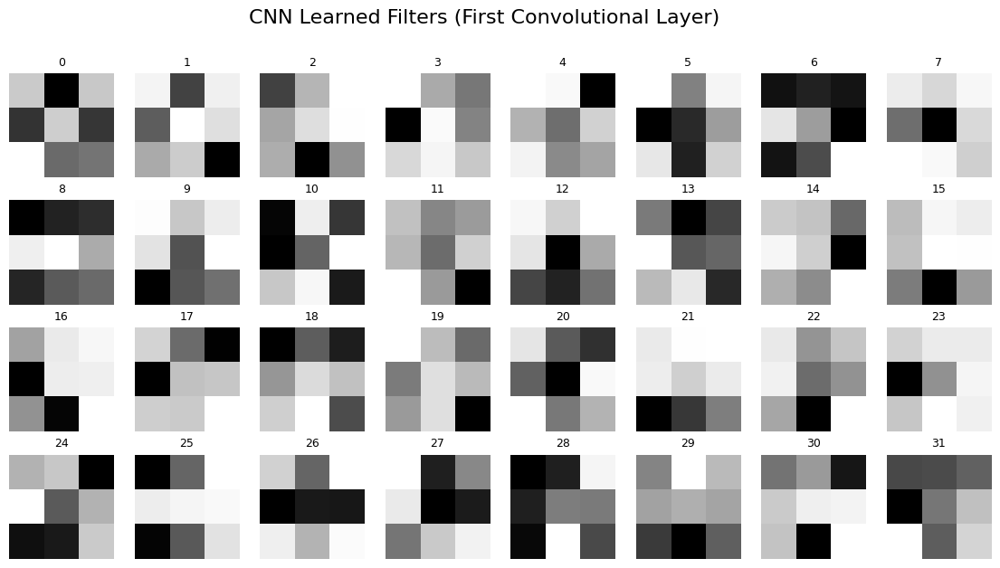

In [19]:
# # Extract and visualise CNN's filters
# best_cnn = cnn_results['best_model'] # we took the one we loaded from previous training, but the first time this is where best_cnn is computed

cnn_filters = extract_cnn_filters(best_cnn)
plot_cnn_filters(cnn_filters, num_filters=32, save_path='cnn_filters.png')


### ScatNet

In [20]:
from colorsys import hls_to_rgb
from kymatio.scattering2d.filter_bank import filter_bank
from scipy.fft import fft2

# Colourise complex filters (phase=colour, magnitude=saturation)
def colorize(z):

    n, m = z.shape
    c = np.zeros((n, m, 3))
    c[np.isinf(z)] = (1.0, 1.0, 1.0)
    c[np.isnan(z)] = (0.5, 0.5, 0.5)

    idx = ~(np.isinf(z) + np.isnan(z))
    A = (np.angle(z[idx]) + np.pi) / (2*np.pi)
    A = (A + 0.5) % 1.0
    B = 1.0/(1.0 + abs(z[idx])**0.3)
    c[idx] = [hls_to_rgb(a, b, 0.8) for a, b in zip(A, B)]
    return c

# Visualise ScatNet's filters (wavelets)
def plot_scatnet_filters(J, L, image_size=128):

    # Generate filters
    filters_set = filter_bank(image_size, image_size, J, L=L)

    # Wavelets (psi)
    fig, axs = plt.subplots(J, L, figsize=(14, 7))
    fig.suptitle('ScatNet Wavelets (Fixed Filters at Different Scales and Orientations)',
                 fontsize=16, y=0.98)

    i = 0
    for filter_dict in filters_set['psi']:
        f = filter_dict['levels'][0]
        filter_c = fft2(f)
        filter_c = np.fft.fftshift(filter_c)

        row = i // L
        col = i % L

        if J == 1:
            ax = axs[col]
        else:
            ax = axs[row, col]

        ax.imshow(colorize(filter_c))
        ax.axis('off')
        ax.set_title(f'j={row}, θ={col}', fontsize=9)
        i += 1

    plt.tight_layout()
    plt.show()

    # Low-pass filter (phi)
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    fig.suptitle('ScatNet Low-Pass Filter (Scaling Function)', fontsize=14)

    f = filters_set['phi']['levels'][0]
    filter_c = fft2(f)
    filter_c = np.fft.fftshift(filter_c)
    filter_c = np.abs(filter_c)

    ax.imshow(filter_c, cmap='gray_r')
    ax.axis('off')

    plt.tight_layout()
    plt.show()

    print(f"\n ScatNet Filter Analysis:")
    print(f"  • Number of wavelets: {J * L} ({J} scales × {L} orientations)")
    print(f"  • Type: Fixed mathematical wavelets (Morlet)")
    print(f"  • Plus 1 low-pass filter (scaling function)\n")


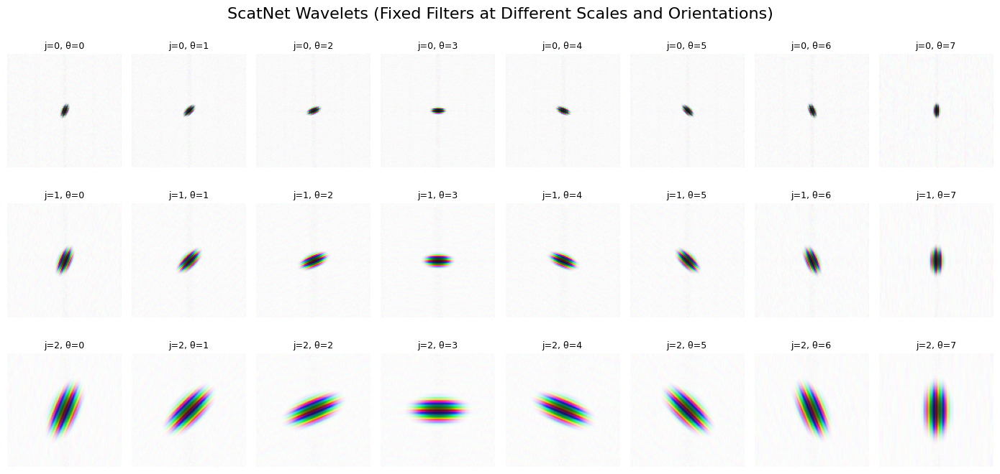

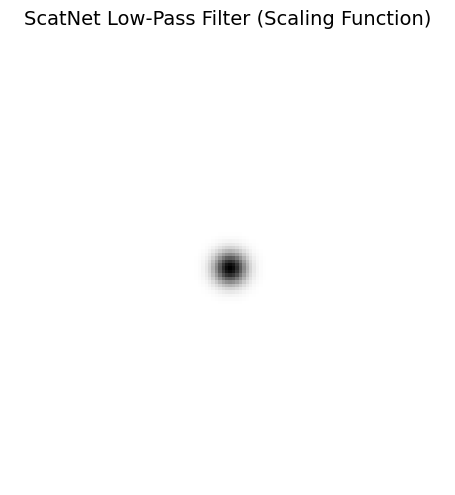


 ScatNet Filter Analysis:
  • Number of wavelets: 24 (3 scales × 8 orientations)
  • Type: Fixed mathematical wavelets (Morlet)
  • Plus 1 low-pass filter (scaling function)



In [21]:
# # Visualise ScatNet's filters
# best_scatnet = scatnet_results['best_model'] # same as CNN

plot_scatnet_filters(J=3, L=8, image_size=128)

# Test dataset

In [22]:

def test_model(model, X_test, y_test, model_name, batch_size=32):

    # Test dataset preparation
    X_test_tensor = torch.from_numpy(X_test).permute(0, 3, 1, 2)
    y_test_tensor = torch.from_numpy(y_test).long()
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Evaluation
    model.eval()
    all_predictions = []
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_predictions = np.array(all_predictions)
    all_labels = np.array(all_labels)

    # Calculate metrics
    test_acc = accuracy_score(all_labels, all_predictions)
    test_f1 = f1_score(all_labels, all_predictions, average='weighted')

    # Print results
    print(f"Test Results:")
    print(f"  • Test Accuracy:  {test_acc:.4f}")
    print(f"  • Test F1-Score:  {test_f1:.4f}\n")

    # Classification report
    print("Classification Report:")
    print(classification_report(all_labels, all_predictions,
                                target_names=['Cat', 'Dog'],
                                digits=4))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_predictions)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Cat', 'Dog'],
                yticklabels=['Cat', 'Dog'],
                cbar_kws={'label': 'Count'})
    plt.title(f'{model_name} - Confusion Matrix', fontsize=14, pad=15)
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.tight_layout()
    plt.show()

    return {
        'accuracy': test_acc,
        'f1_score': test_f1,
        'predictions': all_predictions,
        'labels': all_labels,
        'confusion_matrix': cm
      }


Test Results:
  • Test Accuracy:  0.7581
  • Test F1-Score:  0.7575

Classification Report:
              precision    recall  f1-score   support

         Cat     0.7867    0.7082    0.7454       401
         Dog     0.7347    0.8080    0.7696       401

    accuracy                         0.7581       802
   macro avg     0.7607    0.7581    0.7575       802
weighted avg     0.7607    0.7581    0.7575       802



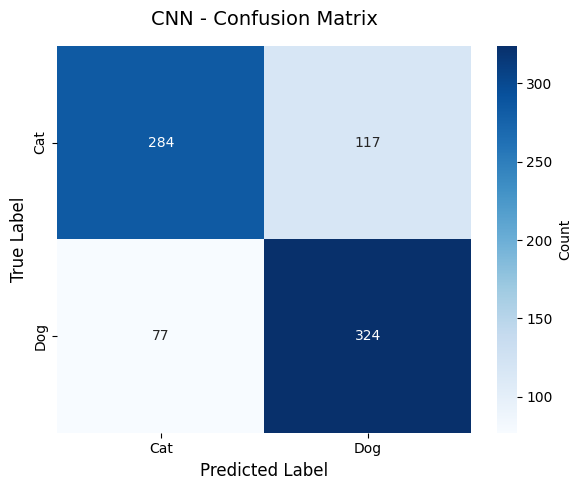

Test Results:
  • Test Accuracy:  0.7793
  • Test F1-Score:  0.7785

Classification Report:
              precision    recall  f1-score   support

         Cat     0.7489    0.8404    0.7920       401
         Dog     0.8182    0.7182    0.7649       401

    accuracy                         0.7793       802
   macro avg     0.7835    0.7793    0.7785       802
weighted avg     0.7835    0.7793    0.7785       802



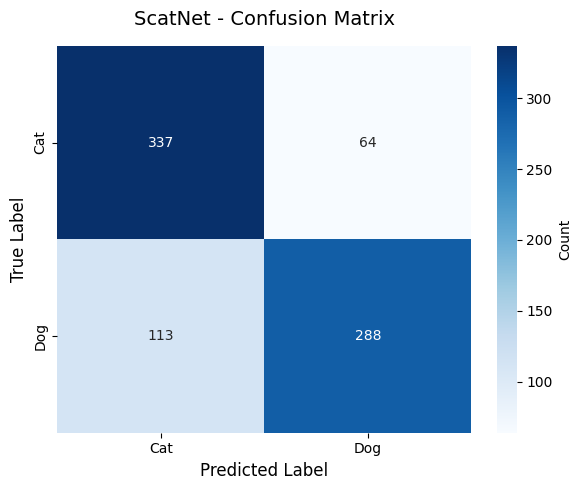

In [23]:
# Test CNN
cnn_test_results = test_model(
    model=best_cnn,
    X_test=X_test,
    y_test=y_test,
    model_name="CNN",
    batch_size=BATCH_SIZE
)

# Test ScatNet
scatnet_test_results = test_model(
    model=best_scatnet,
    X_test=X_test,
    y_test=y_test,
    model_name="ScatNet",
    batch_size=BATCH_SIZE
)


In [24]:
# # Comparative graph
# fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# # Validation accuracy
# models = ['CNN', 'ScatNet']
# val_accs = [cnn_results['val_acc_mean'], scatnet_results['val_acc_mean']]
# val_stds = [cnn_results['val_acc_std'], scatnet_results['val_acc_std']]
# test_accs = [cnn_test_results['accuracy'], scatnet_test_results['accuracy']]

# x = np.arange(len(models))
# width = 0.35

# axes[0].bar(x - width/2, val_accs, width, label='Validation',
#             yerr=val_stds, capsize=5, color='skyblue')
# axes[0].bar(x + width/2, test_accs, width, label='Test',
#             color='lightcoral')
# axes[0].set_ylabel('Accuracy', fontsize=12)
# axes[0].set_title('Accuracy Comparison', fontsize=14)
# axes[0].set_xticks(x)
# axes[0].set_xticklabels(models)
# axes[0].legend()
# axes[0].set_ylim([0, 1])
# axes[0].grid(axis='y', alpha=0.3)

# # F1-Score
# val_f1s = [cnn_results['val_f1_mean'], scatnet_results['val_f1_mean']]
# val_f1_stds = [cnn_results['val_f1_std'], scatnet_results['val_f1_std']]
# test_f1s = [cnn_test_results['f1_score'], scatnet_test_results['f1_score']]

# axes[1].bar(x - width/2, val_f1s, width, label='Validation',
#             yerr=val_f1_stds, capsize=5, color='skyblue')
# axes[1].bar(x + width/2, test_f1s, width, label='Test',
#             color='lightcoral')
# axes[1].set_ylabel('F1-Score', fontsize=12)
# axes[1].set_title('F1-Score Comparison', fontsize=14)
# axes[1].set_xticks(x)
# axes[1].set_xticklabels(models)
# axes[1].legend()
# axes[1].set_ylim([0, 1])
# axes[1].grid(axis='y', alpha=0.3)

# plt.tight_layout()
# plt.show()

In [25]:
# # Download on Google Drive if model is satisfying (to avoid training time next time)
# torch.save(best_cnn.state_dict(), GLOBAL_PATH + '/best_cnn.pth')
# torch.save(best_scatnet.state_dict(), GLOBAL_PATH + '/best_scatnet.pth')
# print("Models downloaded!")

# XAI methods

In [26]:
SIGMA = 1.0 #for gaussian_filter

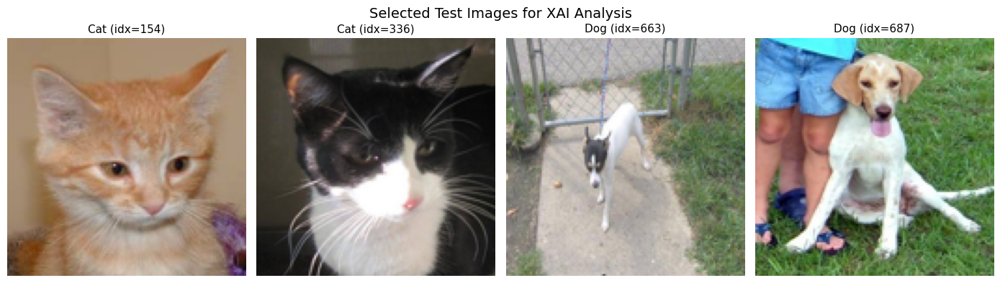

In [27]:
# First, get predictions on test set
best_cnn.eval()
X_test_tensor = torch.tensor(X_test).permute(0, 3, 1, 2).float().to(DEVICE)
with torch.no_grad():
    preds_cnn = torch.argmax(best_cnn(X_test_tensor), dim=1).cpu().numpy()

# Indexes well classified by CNN
correct_cats = np.where((y_test == 0) & (preds_cnn == 0))[0]
correct_dogs = np.where((y_test == 1) & (preds_cnn == 1))[0]

# Choose 2 per class
np.random.seed(19)
idx_cats = np.random.choice(correct_cats, size=2, replace=False)
idx_dogs = np.random.choice(correct_dogs, size=2, replace=False)
idx_subjs = np.concatenate([idx_cats, idx_dogs])

fig, axes = plt.subplots(1, 4, figsize=(14, 4))
fig.suptitle('Selected Test Images for XAI Analysis', fontsize=14)

for i, idx in enumerate(idx_subjs):
    axes[i].imshow(X_test[idx])
    axes[i].set_title(f'{"Cat" if y_test[idx]==0 else "Dog"} (idx={idx})', fontsize=11)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [28]:
# Preparing inputs once for all methods
input_img = torch.tensor(X_test[idx_subjs]).permute(0, 3, 1, 2).float().to(DEVICE)
img_label = torch.tensor(y_test[idx_subjs]).long().to(DEVICE)

class_names = {0: 'Cat', 1: 'Dog'}

## XAI : Saliency

Saliency CNN:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
Saliency ScatNet: 100%|██████████| 4/4 [00:01<00:00,  2.71it/s]


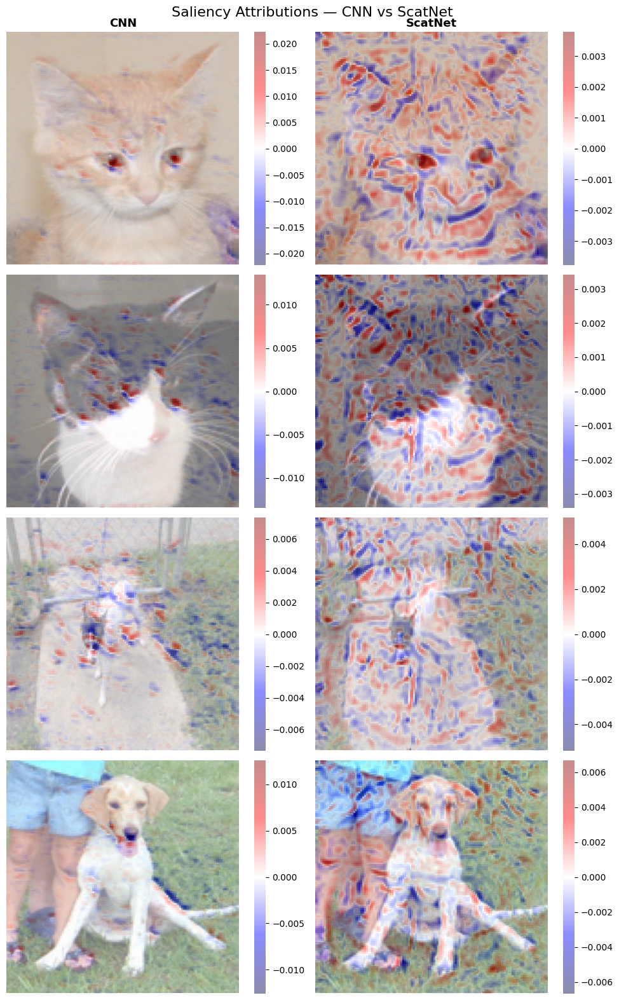

In [29]:
# CNN
best_cnn.eval()
xai_cnn = Saliency(best_cnn)

attributions_saliency_cnn = []
for i in tqdm(range(len(idx_subjs)), desc='Saliency CNN'):
    inp = input_img[i].unsqueeze(0)
    attr = xai_cnn.attribute(inp, target=img_label[i], abs=False)
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_saliency_cnn.append(attr)
attributions_saliency_cnn = gaussian_filter(np.stack(attributions_saliency_cnn), sigma=SIGMA)

# ScatNet
best_scatnet.eval()
xai_scatnet = Saliency(best_scatnet)

attributions_saliency_scatnet = []
for i in tqdm(range(len(idx_subjs)), desc='Saliency ScatNet'):
    inp = input_img[i].unsqueeze(0).contiguous()
    attr = xai_scatnet.attribute(inp, target=img_label[i], abs=False)
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_saliency_scatnet.append(attr)
attributions_saliency_scatnet = gaussian_filter(np.stack(attributions_saliency_scatnet), sigma=SIGMA)

# Visualisation
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 16))
fig.suptitle('Saliency Attributions — CNN vs ScatNet', fontsize=16)

axes[0][0].set_title('CNN', fontsize=13, fontweight='bold')
axes[0][1].set_title('ScatNet', fontsize=13, fontweight='bold')

for i in range(4):
    img_np = X_test[idx_subjs[i]]
    label_name = class_names[img_label[i].item()]

    # CNN attribution
    vmax = np.abs(attributions_saliency_cnn[i]).max()
    axes[i][0].imshow(img_np)
    sns.heatmap(attributions_saliency_cnn[i], ax=axes[i][0], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][0].set_ylabel(f'True: {label_name}', fontsize=10)
    axes[i][0].axis('off')

    # ScatNet attribution
    vmax = np.abs(attributions_saliency_scatnet[i]).max()
    axes[i][1].imshow(img_np)
    sns.heatmap(attributions_saliency_scatnet[i], ax=axes[i][1], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][1].axis('off')

plt.tight_layout()
plt.show()

## XAI : Input x Gradient

InputXGradient CNN:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
InputXGradient ScatNet: 100%|██████████| 4/4 [00:01<00:00,  2.96it/s]


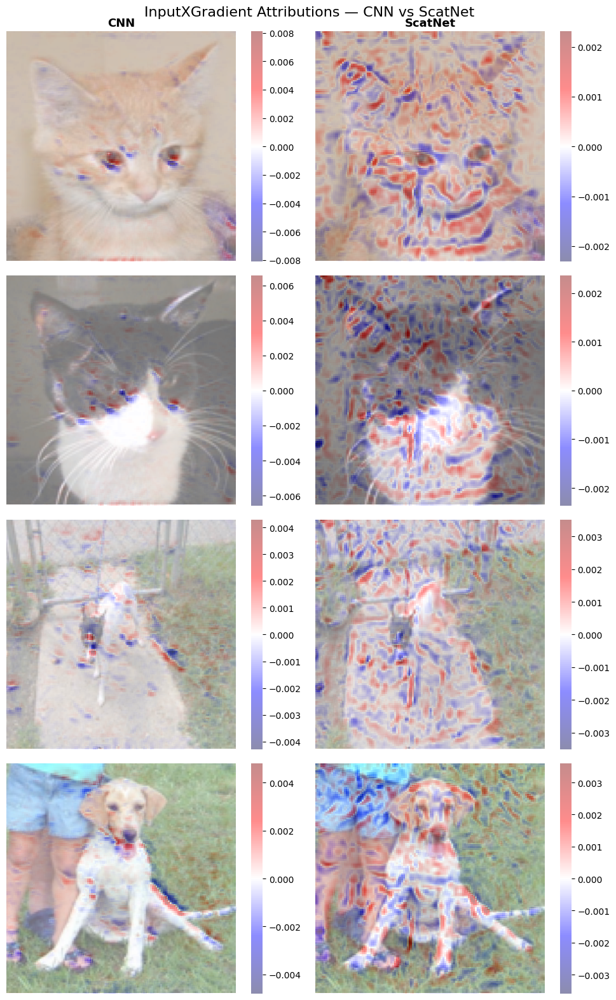

In [30]:
# CNN
best_cnn.eval()
xai_cnn = InputXGradient(best_cnn)

attributions_ixg_cnn = []
for i in tqdm(range(len(idx_subjs)), desc='InputXGradient CNN'):
    inp = input_img[i].unsqueeze(0)
    attr = xai_cnn.attribute(inp, target=img_label[i])
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_ixg_cnn.append(attr)
attributions_ixg_cnn = gaussian_filter(np.stack(attributions_ixg_cnn), sigma=SIGMA)

# ScatNet
best_scatnet.eval()
xai_scatnet = InputXGradient(best_scatnet)

attributions_ixg_scatnet = []
for i in tqdm(range(len(idx_subjs)), desc='InputXGradient ScatNet'):
    inp = input_img[i].unsqueeze(0).contiguous()
    attr = xai_scatnet.attribute(inp, target=img_label[i])
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_ixg_scatnet.append(attr)
attributions_ixg_scatnet = gaussian_filter(np.stack(attributions_ixg_scatnet), sigma=SIGMA)

# Visualisation
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 16))
fig.suptitle('InputXGradient Attributions — CNN vs ScatNet', fontsize=16)

axes[0][0].set_title('CNN', fontsize=13, fontweight='bold')
axes[0][1].set_title('ScatNet', fontsize=13, fontweight='bold')

for i in range(4):
    img_np = X_test[idx_subjs[i]]
    label_name = class_names[img_label[i].item()]

    vmax = np.abs(attributions_ixg_cnn[i]).max()
    axes[i][0].imshow(img_np)
    sns.heatmap(attributions_ixg_cnn[i], ax=axes[i][0], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][0].set_ylabel(f'True: {label_name}', fontsize=10)
    axes[i][0].axis('off')

    vmax = np.abs(attributions_ixg_scatnet[i]).max()
    axes[i][1].imshow(img_np)
    sns.heatmap(attributions_ixg_scatnet[i], ax=axes[i][1], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][1].axis('off')

plt.tight_layout()
plt.show()

## XAI : GuidedBackprop

GuidedBackprop CNN:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:63: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/usr/local/lib/python3.12/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:66: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(
GuidedBackprop ScatNet: 100%|██████████| 4/4 [00:02<00:00,  1.60it/s]


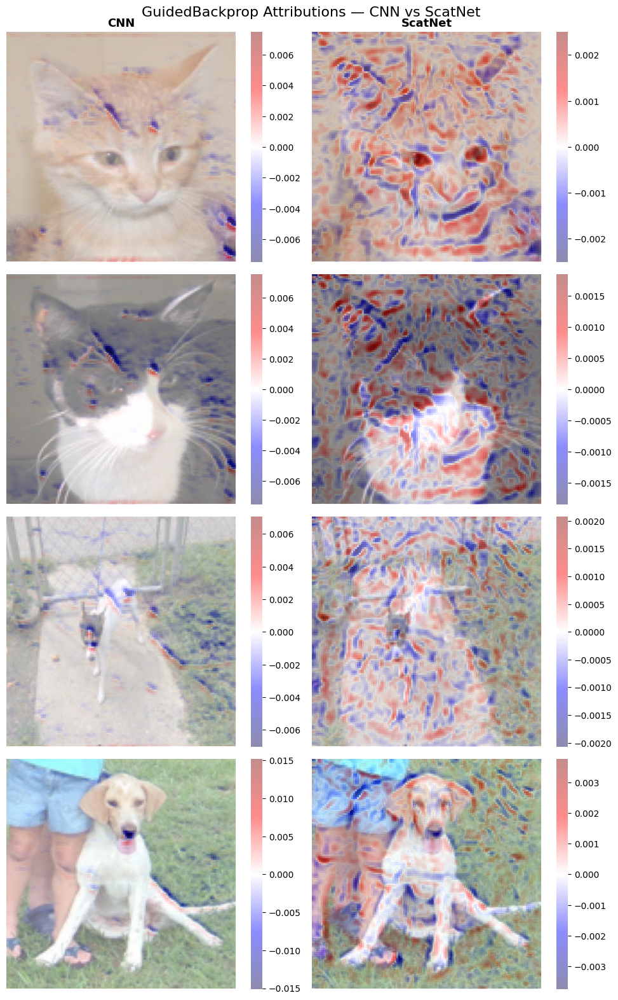

In [31]:
# CNN
best_cnn.eval()
xai_cnn = GuidedBackprop(best_cnn)

attributions_gbp_cnn = []
for i in tqdm(range(len(idx_subjs)), desc='GuidedBackprop CNN'):
    inp = input_img[i].unsqueeze(0)
    attr = xai_cnn.attribute(inp, target=img_label[i])
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_gbp_cnn.append(attr)
attributions_gbp_cnn = gaussian_filter(np.stack(attributions_gbp_cnn), sigma=SIGMA)

# ScatNet
best_scatnet.eval()
xai_scatnet = GuidedBackprop(best_scatnet)

attributions_gbp_scatnet = []
for i in tqdm(range(len(idx_subjs)), desc='GuidedBackprop ScatNet'):
    inp = input_img[i].unsqueeze(0).contiguous()
    attr = xai_scatnet.attribute(inp, target=img_label[i])
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_gbp_scatnet.append(attr)
attributions_gbp_scatnet = gaussian_filter(np.stack(attributions_gbp_scatnet), sigma=SIGMA)

# Visualisation
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 16))
fig.suptitle('GuidedBackprop Attributions — CNN vs ScatNet', fontsize=16)

axes[0][0].set_title('CNN', fontsize=13, fontweight='bold')
axes[0][1].set_title('ScatNet', fontsize=13, fontweight='bold')

for i in range(4):
    img_np = X_test[idx_subjs[i]]
    label_name = class_names[img_label[i].item()]

    vmax = np.abs(attributions_gbp_cnn[i]).max()
    axes[i][0].imshow(img_np)
    sns.heatmap(attributions_gbp_cnn[i], ax=axes[i][0], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][0].set_ylabel(f'True: {label_name}', fontsize=10)
    axes[i][0].axis('off')

    vmax = np.abs(attributions_gbp_scatnet[i]).max()
    axes[i][1].imshow(img_np)
    sns.heatmap(attributions_gbp_scatnet[i], ax=axes[i][1], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][1].axis('off')

plt.tight_layout()
plt.show()

## XAI : Deconvolution

Deconvolution CNN:   0%|          | 0/4 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:63: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/usr/local/lib/python3.12/dist-packages/captum/attr/_core/guided_backprop_deconvnet.py:66: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(
Deconvolution ScatNet: 100%|██████████| 4/4 [00:01<00:00,  3.07it/s]


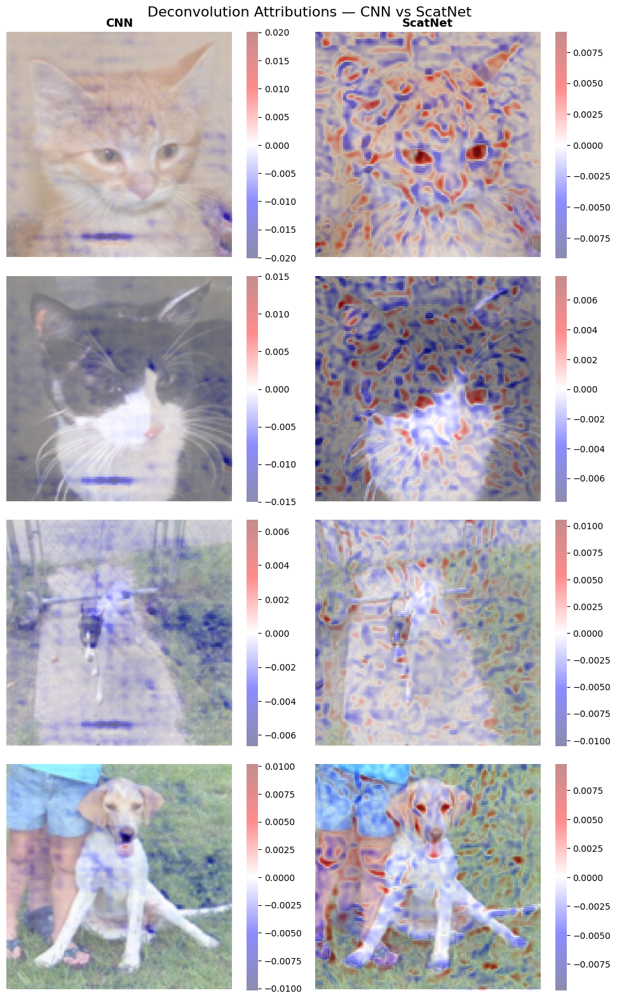

In [32]:
# CNN
best_cnn.eval()
xai_cnn = Deconvolution(best_cnn)

attributions_deconv_cnn = []
for i in tqdm(range(len(idx_subjs)), desc='Deconvolution CNN'):
    inp = input_img[i].unsqueeze(0)
    attr = xai_cnn.attribute(inp, target=img_label[i])
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_deconv_cnn.append(attr)
attributions_deconv_cnn = gaussian_filter(np.stack(attributions_deconv_cnn), sigma=SIGMA)

# ScatNet
best_scatnet.eval()
xai_scatnet = Deconvolution(best_scatnet)

attributions_deconv_scatnet = []
for i in tqdm(range(len(idx_subjs)), desc='Deconvolution ScatNet'):
    inp = input_img[i].unsqueeze(0).contiguous()
    attr = xai_scatnet.attribute(inp, target=img_label[i])
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_deconv_scatnet.append(attr)
attributions_deconv_scatnet = gaussian_filter(np.stack(attributions_deconv_scatnet), sigma=SIGMA)

# Visualisation
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 16))
fig.suptitle('Deconvolution Attributions — CNN vs ScatNet', fontsize=16)

axes[0][0].set_title('CNN', fontsize=13, fontweight='bold')
axes[0][1].set_title('ScatNet', fontsize=13, fontweight='bold')

for i in range(4):
    img_np = X_test[idx_subjs[i]]
    label_name = class_names[img_label[i].item()]

    vmax = np.abs(attributions_deconv_cnn[i]).max()
    axes[i][0].imshow(img_np)
    sns.heatmap(attributions_deconv_cnn[i], ax=axes[i][0], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][0].set_ylabel(f'True: {label_name}', fontsize=10)
    axes[i][0].axis('off')

    vmax = np.abs(attributions_deconv_scatnet[i]).max()
    axes[i][1].imshow(img_np)
    sns.heatmap(attributions_deconv_scatnet[i], ax=axes[i][1], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][1].axis('off')

plt.tight_layout()
plt.show()

## XAI : IntegratedGradient

IntegratedGradients ScatNet: 100%|██████████| 4/4 [00:06<00:00,  1.64s/it]


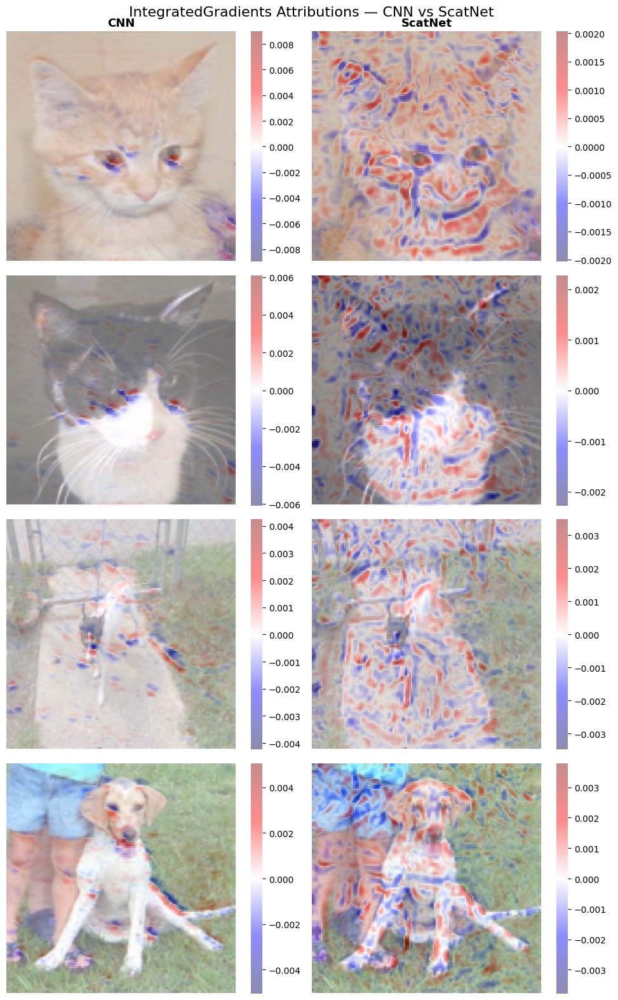

In [33]:
# CNN
best_cnn.eval()
xai_cnn = IntegratedGradients(best_cnn)

attributions_ig_cnn = []
for i in tqdm(range(len(idx_subjs)), desc='IntegratedGradients CNN'):
    inp = input_img[i].unsqueeze(0)
    attr = xai_cnn.attribute(inp, target=img_label[i], n_steps=200)
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_ig_cnn.append(attr)
attributions_ig_cnn = gaussian_filter(np.stack(attributions_ig_cnn), sigma=SIGMA)

# ScatNet
best_scatnet.eval()
xai_scatnet = IntegratedGradients(best_scatnet)

attributions_ig_scatnet = []
for i in tqdm(range(len(idx_subjs)), desc='IntegratedGradients ScatNet'):
    inp = input_img[i].unsqueeze(0).contiguous()
    attr = xai_scatnet.attribute(inp, target=img_label[i], n_steps=200)
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_ig_scatnet.append(attr)
attributions_ig_scatnet = gaussian_filter(np.stack(attributions_ig_scatnet), sigma=SIGMA)

# Visualisation
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 16))
fig.suptitle('IntegratedGradients Attributions — CNN vs ScatNet', fontsize=16)

axes[0][0].set_title('CNN', fontsize=13, fontweight='bold')
axes[0][1].set_title('ScatNet', fontsize=13, fontweight='bold')

for i in range(4):
    img_np = X_test[idx_subjs[i]]
    label_name = class_names[img_label[i].item()]

    vmax = np.abs(attributions_ig_cnn[i]).max()
    axes[i][0].imshow(img_np)
    sns.heatmap(attributions_ig_cnn[i], ax=axes[i][0], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][0].set_ylabel(f'True: {label_name}', fontsize=10)
    axes[i][0].axis('off')

    vmax = np.abs(attributions_ig_scatnet[i]).max()
    axes[i][1].imshow(img_np)
    sns.heatmap(attributions_ig_scatnet[i], ax=axes[i][1], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][1].axis('off')

plt.tight_layout()
plt.show()

## XAI : Occlusion

Occlusion ScatNet: 100%|██████████| 4/4 [02:52<00:00, 43.13s/it]


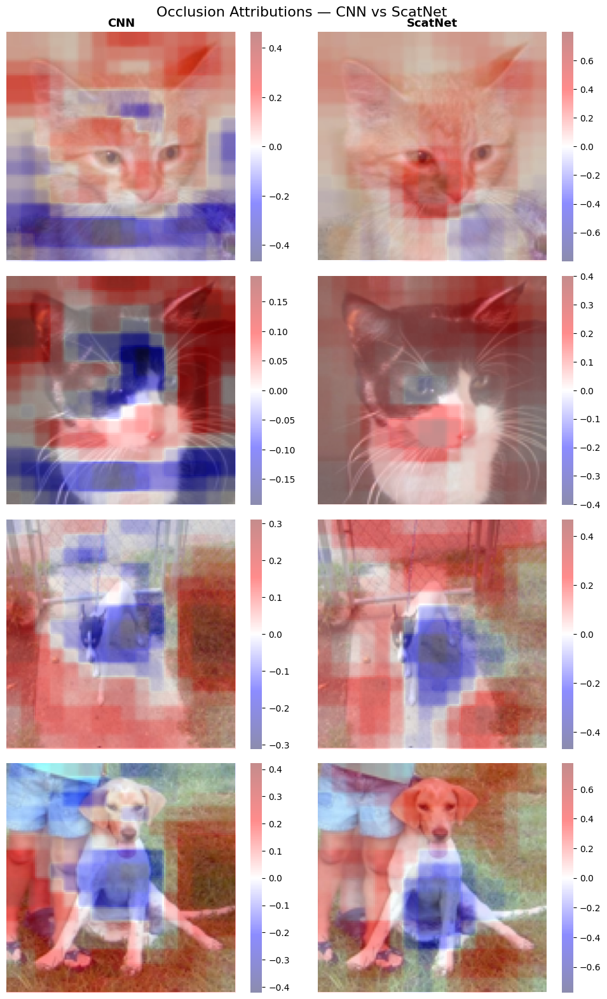

In [34]:
# CNN
best_cnn.eval()
xai_cnn = Occlusion(best_cnn)

attributions_occ_cnn = []
for i in tqdm(range(len(idx_subjs)), desc='Occlusion CNN'):
    inp = input_img[i].unsqueeze(0)
    attr = xai_cnn.attribute(inp, target=img_label[i],
                             sliding_window_shapes=(3, 16, 16),  # window on 3 channels
                             strides=(3, 8, 8))                  # stride of 8 pixels
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_occ_cnn.append(attr)
attributions_occ_cnn = gaussian_filter(np.stack(attributions_occ_cnn), sigma=SIGMA)

# ScatNet
best_scatnet.eval()
xai_scatnet = Occlusion(best_scatnet)

attributions_occ_scatnet = []
for i in tqdm(range(len(idx_subjs)), desc='Occlusion ScatNet'):
    inp = input_img[i].unsqueeze(0).contiguous()
    attr = xai_scatnet.attribute(inp, target=img_label[i],
                                 sliding_window_shapes=(3, 16, 16),
                                 strides=(3, 8, 8))
    attr = attr.squeeze().detach().cpu().numpy().mean(axis=0)
    attributions_occ_scatnet.append(attr)
attributions_occ_scatnet = gaussian_filter(np.stack(attributions_occ_scatnet), sigma=SIGMA)

# Visualisation
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 16))
fig.suptitle('Occlusion Attributions — CNN vs ScatNet', fontsize=16)

axes[0][0].set_title('CNN', fontsize=13, fontweight='bold')
axes[0][1].set_title('ScatNet', fontsize=13, fontweight='bold')

for i in range(4):
    img_np = X_test[idx_subjs[i]]
    label_name = class_names[img_label[i].item()]

    vmax = np.abs(attributions_occ_cnn[i]).max()
    axes[i][0].imshow(img_np)
    sns.heatmap(attributions_occ_cnn[i], ax=axes[i][0], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][0].set_ylabel(f'True: {label_name}', fontsize=10)
    axes[i][0].axis('off')

    vmax = np.abs(attributions_occ_scatnet[i]).max()
    axes[i][1].imshow(img_np)
    sns.heatmap(attributions_occ_scatnet[i], ax=axes[i][1], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][1].axis('off')

plt.tight_layout()
plt.show()

## XAI : Saliency from scratch

In [35]:
class SaliencyFromScratch:
    def __init__(self, model):
        self.model = model

    def attribute(self, input_tensor, target):
        # Gradient activated
        x = input_tensor.clone().requires_grad_(True)

        # Forward pass
        self.model.zero_grad()
        output = self.model(x)

        # Score from target class
        score = output[0, target]

        # Backward pass
        score.backward()

        attribution = x.grad.detach()

        return attribution

### CNN

Saliency Scratch CNN: 100%|██████████| 4/4 [00:00<00:00, 57.31it/s]


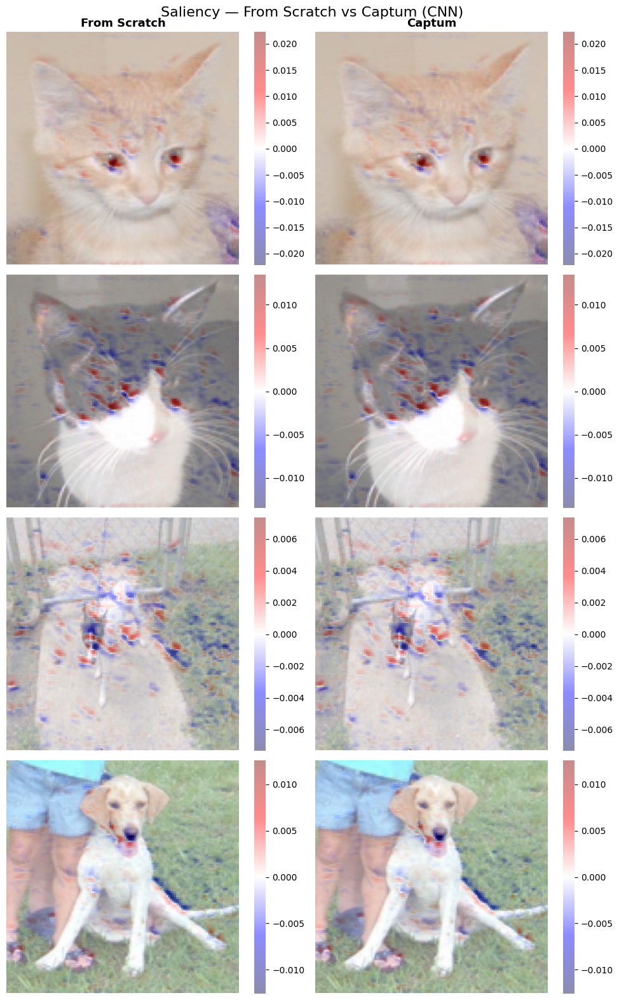

In [36]:
# Saliency FROM SCRATCH on CNN
best_cnn.eval()
xai_scratch_cnn = SaliencyFromScratch(best_cnn)

attributions_scratch_cnn = []
for i in tqdm(range(len(idx_subjs)), desc='Saliency Scratch CNN'):
    inp = input_img[i].unsqueeze(0)
    attr = xai_scratch_cnn.attribute(inp, target=img_label[i].item())
    attr = attr.squeeze().cpu().numpy().mean(axis=0)
    attributions_scratch_cnn.append(attr)
attributions_scratch_cnn = gaussian_filter(np.stack(attributions_scratch_cnn), sigma=SIGMA)

# CNN : Scratch vs Captum
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 16))
fig.suptitle('Saliency — From Scratch vs Captum (CNN)', fontsize=16)

axes[0][0].set_title('From Scratch', fontsize=13, fontweight='bold')
axes[0][1].set_title('Captum', fontsize=13, fontweight='bold')

for i in range(4):
    img_np = X_test[idx_subjs[i]]
    label_name = class_names[img_label[i].item()]

    vmax = np.abs(attributions_scratch_cnn[i]).max()
    axes[i][0].imshow(img_np)
    sns.heatmap(attributions_scratch_cnn[i], ax=axes[i][0], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][0].set_ylabel(f'True: {label_name}', fontsize=10)
    axes[i][0].axis('off')

    vmax = np.abs(attributions_saliency_cnn[i]).max()
    axes[i][1].imshow(img_np)
    sns.heatmap(attributions_saliency_cnn[i], ax=axes[i][1], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][1].axis('off')

plt.tight_layout()
plt.show()


### ScatNet

Saliency Scratch ScatNet: 100%|██████████| 4/4 [00:01<00:00,  3.03it/s]


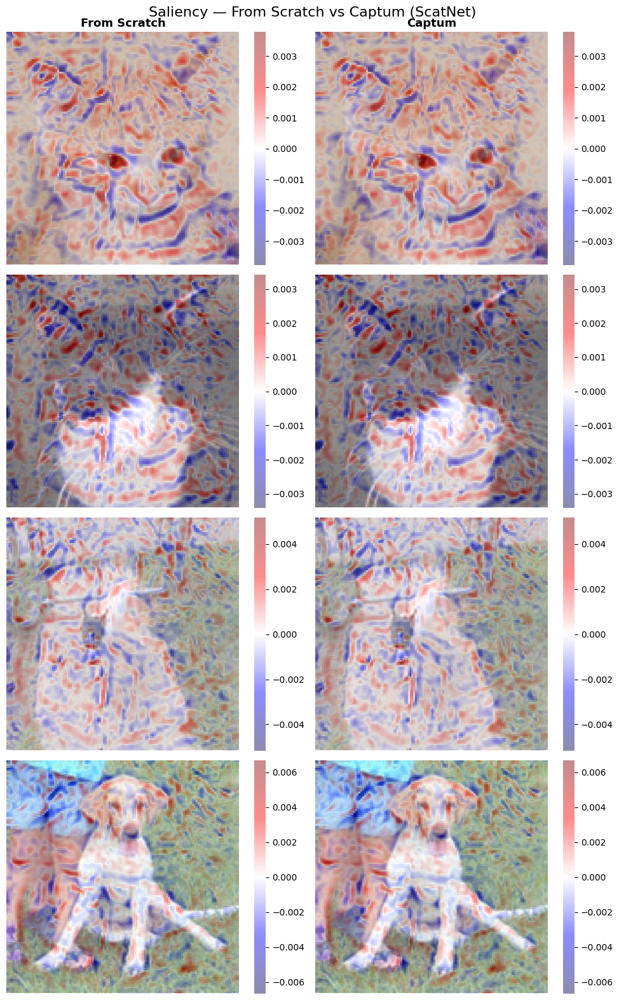

In [38]:

# Saliency FROM SCRATCH on ScatNet
best_scatnet.eval()
xai_scratch_scatnet = SaliencyFromScratch(best_scatnet)

attributions_scratch_scatnet = []
for i in tqdm(range(len(idx_subjs)), desc='Saliency Scratch ScatNet'):
    inp = input_img[i].unsqueeze(0).contiguous()
    attr = xai_scratch_scatnet.attribute(inp, target=img_label[i].item())
    attr = attr.squeeze().cpu().numpy().mean(axis=0)
    attributions_scratch_scatnet.append(attr)
attributions_scratch_scatnet = gaussian_filter(np.stack(attributions_scratch_scatnet), sigma=SIGMA)

# ScatNet : Scratch vs Captum
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 16))
fig.suptitle('Saliency — From Scratch vs Captum (ScatNet)', fontsize=16)

axes[0][0].set_title('From Scratch', fontsize=13, fontweight='bold')
axes[0][1].set_title('Captum', fontsize=13, fontweight='bold')

for i in range(4):
    img_np = X_test[idx_subjs[i]]
    label_name = class_names[img_label[i].item()]

    vmax = np.abs(attributions_scratch_scatnet[i]).max()
    axes[i][0].imshow(img_np)
    sns.heatmap(attributions_scratch_scatnet[i], ax=axes[i][0], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][0].set_ylabel(f'True: {label_name}', fontsize=10)
    axes[i][0].axis('off')

    vmax = np.abs(attributions_saliency_scatnet[i]).max()
    axes[i][1].imshow(img_np)
    sns.heatmap(attributions_saliency_scatnet[i], ax=axes[i][1], cmap='seismic',
                alpha=0.45, cbar=True, vmax=vmax, vmin=-vmax,
                xticklabels=False, yticklabels=False)
    axes[i][1].axis('off')

plt.tight_layout()
plt.show()



In [39]:
# Quantitative verification
print("CNN — max scratch vs captum:")
for i in range(4):
    diff = np.abs(attributions_scratch_cnn[i] - attributions_saliency_cnn[i]).max()
    print(f'  Image {i} : {diff:.2e}')

print("\nScatNet — max scratch vs captum:")
for i in range(4):
    diff = np.abs(attributions_scratch_scatnet[i] - attributions_saliency_scatnet[i]).max()
    print(f'  Image {i} : {diff:.2e}')

CNN — max scratch vs captum:
  Image 0 : 9.31e-10
  Image 1 : 9.31e-10
  Image 2 : 4.66e-10
  Image 3 : 9.31e-10

ScatNet — max scratch vs captum:
  Image 0 : 1.16e-10
  Image 1 : 1.16e-10
  Image 2 : 1.16e-10
  Image 3 : 2.33e-10


## All methods - 1 image (better for report)

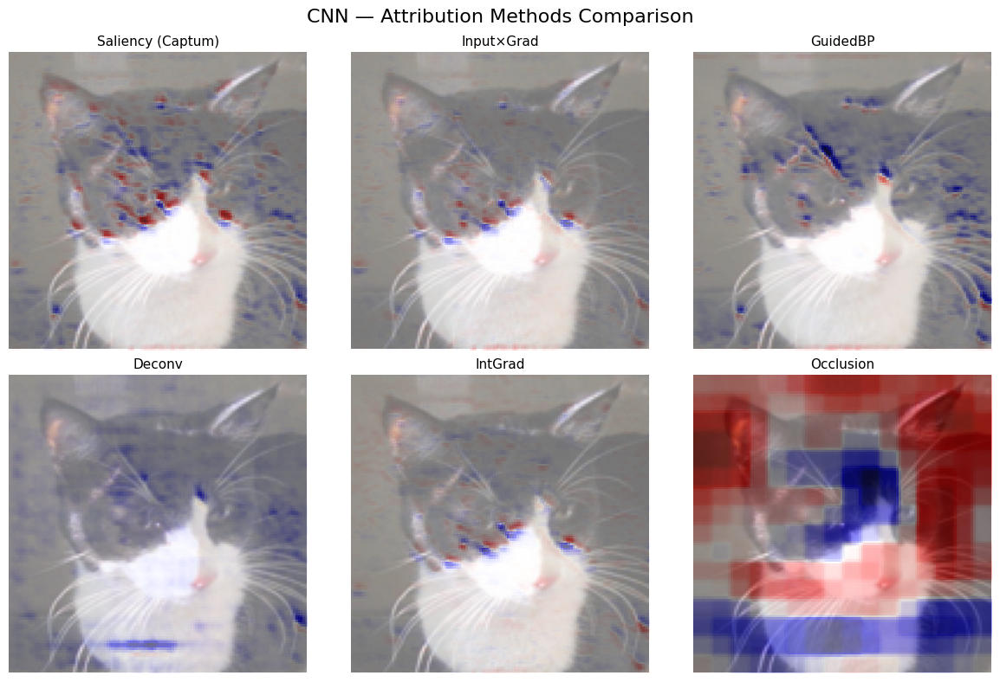

In [44]:
# CNN - All methods (1 image)
img_idx = 1

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))
fig.suptitle('CNN — Attribution Methods Comparison', fontsize=16)

img_np = X_test[idx_subjs[img_idx]]
label_name = class_names[img_label[img_idx].item()]

methods = [
    ("Saliency (Captum)", attributions_saliency_cnn),
    ("Input×Grad", attributions_ixg_cnn),
    ("GuidedBP", attributions_gbp_cnn),
    ("Deconv", attributions_deconv_cnn),
    ("IntGrad", attributions_ig_cnn),
    ("Occlusion", attributions_occ_cnn)
]

for ax, (title, attr_list) in zip(axes.flatten(), methods):

    attr = attr_list[img_idx]
    vmax = np.abs(attr).max()

    ax.set_title(title, fontsize=11)
    ax.imshow(img_np)

    sns.heatmap(
        attr,
        ax=ax,
        cmap='seismic',
        alpha=0.45,
        cbar=False,
        vmax=vmax,
        vmin=-vmax,
        xticklabels=False,
        yticklabels=False
    )

    ax.axis('off')

plt.tight_layout()
plt.show()

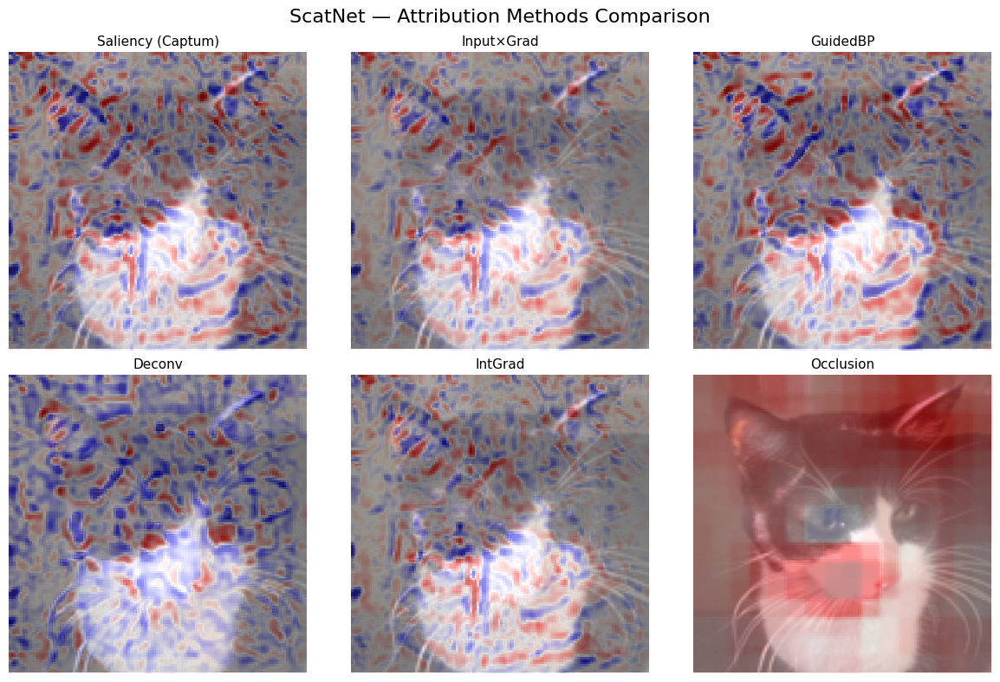

In [45]:
# ScatNet - All methods (1 image)
img_idx = 1

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))
fig.suptitle('ScatNet — Attribution Methods Comparison', fontsize=16)

img_np = X_test[idx_subjs[img_idx]]
label_name = class_names[img_label[img_idx].item()]

methods = [
    ("Saliency (Captum)", attributions_saliency_scatnet),
    ("Input×Grad", attributions_ixg_scatnet),
    ("GuidedBP", attributions_gbp_scatnet),
    ("Deconv", attributions_deconv_scatnet),
    ("IntGrad", attributions_ig_scatnet),
    ("Occlusion", attributions_occ_scatnet)
]

for ax, (title, attr_list) in zip(axes.flatten(), methods):

    attr = attr_list[img_idx]
    vmax = np.abs(attr).max()

    ax.set_title(title, fontsize=11)
    ax.imshow(img_np)

    sns.heatmap(
        attr,
        ax=ax,
        cmap='seismic',
        alpha=0.45,
        cbar=False,
        vmax=vmax,
        vmin=-vmax,
        xticklabels=False,
        yticklabels=False
    )

    ax.axis('off')

plt.tight_layout()
plt.show()